<a href="https://colab.research.google.com/github/niplessa/Thesis_Data-mining-study-on-medical-and-sociological-Data-regarding-Covid19/blob/main/EDA_3_covid19_countries_clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### An attempt to produce countries clusters based on Covid19 deaths on each country.


Datasets are the time-series data from John Hopkins


In [ ]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.cm as cm
import matplotlib.colors as colors
import seaborn as sns


#setting the image size
plt.rcParams['figure.figsize']=(23,13)
from folium import (plugins, FeatureGroup, Map, Circle, Marker,
                    LayerControl, Popup, CircleMarker, Vega)

!pip install tslearn
from tslearn.clustering import TimeSeriesKMeans

#assing continent to country
!pip install pycountry_convert 
import pycountry_convert as pc

## Functions

In [ ]:
#@title Default title text
import numpy as np
import pandas as pd
from geopy.geocoders import Nominatim
#import vincent as v
#v.core.initialize_notebook()

def get_coordinates(address):    
    try:
        geolocator = Nominatim(user_agent="http")
        location = geolocator.geocode(address)
        return [location[-1][0], location[-1][1]]
    except:
        print(f'Oops! No coordinates found for: {address}')
        return [None, None]
def change_col_dt(df):
    new_df = df.T.copy()
    new_df.index =  pd.to_datetime(new_df.index)
    return new_df.T.copy()

def import_data_JHU():
    #uncomment below to get latest data
    # url to the data 'Novel Coronavirus (COVID-19) Cases', provided by JHU CSSE
    #@url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/'

    # confirmed cases and deaths worldwide for each country
    #cases = pd.read_csv(url + 'time_series_covid19_confirmed_global.csv')
    #deaths = pd.read_csv(url + 'time_series_covid19_deaths_global.csv')

    conf_url = 'https://raw.githubusercontent.com/niplessa/Datasets/main/time_series_covid_19_confirmed.csv'
    death_url ='https://raw.githubusercontent.com/niplessa/Datasets/main/time_series_covid_19_deaths.csv'

    cases = pd.read_csv(conf_url)
    deaths = pd.read_csv(death_url
                         )
    # we sum over Province/State for countries (US = Alabama, Alaska,..)
    cases = cases.groupby('Country/Region', axis=0).sum()
    deaths = deaths.groupby('Country/Region', axis=0).sum()
    #group Italy and San Marino:
    cases.loc['Italy'] = cases.loc['Italy'] + cases.loc['San Marino']
    cases.drop(['San Marino'],inplace=True)
    cases.rename(index={'United Kingdom': 'UK'}, inplace=True)
    deaths.loc['Italy'] = deaths.loc['Italy'] + deaths.loc['San Marino']
    deaths.drop(['San Marino'],inplace=True)
    deaths.rename(index={'United Kingdom': 'UK'}, inplace=True)

    # Some cleaning of the data:
    last_day = cases.columns[-1]
    cases.sort_values( [last_day], ascending=False,
                       axis=0, inplace=True)      # ordering by total number of latest point
    deaths = deaths.reindex(index=cases.index)    # same ordering as cases

    cases.index.name = None                       # delete the name of the index
    deaths.index.name = None

    # delete the following rows from the data
    to_del = ['Diamond Princess', 'MS Zaandam', 'Holy See', 'Western Sahara']
    cases = cases.drop(to_del)
    deaths = deaths.drop(to_del)

    new_df = deaths.iloc[:,2:].T.copy()
    new_df.index =  pd.to_datetime(new_df.index)
    deaths = new_df.T.copy()

    new_df = cases.iloc[:,2:].T.copy()
    new_df.index =  pd.to_datetime(new_df.index)
    cases = new_df.T.copy()

    cases.to_csv('cases.csv')
    deaths.to_csv('deaths.csv')
    return True


## Import DataSets

In [ ]:
import_data_JHU()

cases = pd.read_csv('cases.csv', index_col=0)
deaths = pd.read_csv('deaths.csv', index_col=0)
cases = change_col_dt(cases)
deaths = change_col_dt(deaths)

last_day = cases.columns[-1]
print('The data is from ' +
      str(pd.to_datetime(cases.columns[-1]).strftime('%d/%m/%Y')) + '.')


The data is from 23/09/2020.


In [ ]:
#import population data
pop18 = "https://raw.githubusercontent.com/rbiele02/07_clustering_covid_time_series/master/data/population_2018.csv"
population_2018 = pd.read_csv(pop18, index_col=0)
population_2018.rename(index={'United Kingdom': 'UK'}, inplace=True)

In [ ]:
# confirmed cases for each 100k inhabitans
cases_pT =  cases / population_2018.loc[cases.index].values * 100000
deaths_pT = deaths / population_2018.loc[deaths.index].values * 100000
cases_pT.sort_values([last_day], ascending=False, axis=0, inplace=True)
cases_pT_new = cases_pT.diff(axis=1)
deaths_pT_new = deaths_pT.diff(axis=1)

In [ ]:
cord = "https://raw.githubusercontent.com/rbiele02/07_clustering_covid_time_series/master/data/coord_13_09.csv"
coord = pd.read_csv(cord, index_col=0)


## Add continent variable to dataframe

In [ ]:
deaths.loc[deaths.index == "UK"] = "United Kingdom"
deaths.loc[deaths.index == "US"] = "USA"

In [ ]:
continents = {
    'NA': 'North America',
    'SA': 'South America', 
    'AS': 'Asia',
    'OC': 'Australia',
    'AF': 'Africa',
    'EU' : 'Europe',
    'na' : 'Others'
}

In [ ]:
def country_to_continent_code(country):
    try:
        return pc.country_alpha2_to_continent_code(pc.country_name_to_country_alpha2(country))
    except :
        return 'na'


In [ ]:
#get all countries
countries = np.asarray(deaths.index)
countries1 = np.asarray(population_2018.index)
countries2 = np.asarray(coord.index)

deaths.insert(0,"Continent", [continents[country_to_continent_code(country)] for country in countries[:]])
population_2018.insert(0,"Continent", [continents[country_to_continent_code(country)] for country in countries1[:]])
coord.insert(0,"Continent", [continents[country_to_continent_code(country)] for country in countries2[:]])


In [ ]:
#create new dataframe for Europe deaths ,coords & population
europe_pop = population_2018.loc[population_2018.Continent=="Europe"]
europe_deaths = deaths.loc[deaths.Continent=="Europe"]
europe_coords = coord.loc[coord.Continent=="Europe"]

In [ ]:
#drop the Continent Variable, no longer needed it will create problems in the timeseries analysis
europe_pop=europe_pop.drop("Continent",axis=1)
europe_deaths = europe_deaths.drop("Continent",axis=1)
europe_coords = europe_coords.drop("Continent",axis=1)

In [ ]:
population_2018=population_2018.drop("Continent",axis=1)
deaths = deaths.drop("Continent",axis=1)
coord = coord.drop("Continent",axis=1)

In [ ]:
deaths_pT_eur = europe_deaths / europe_pop.loc[europe_deaths.index].values * 100000
deaths_pT_new_eur = deaths_pT_eur.diff(axis=1)

## Clustering bases on Deaths per population

6.648 --> 5.868 --> 5.868 --> 
4.915 --> 3.820 --> 3.754 --> 3.736 --> 3.725 --> 3.725 --> 
4.052 --> 2.846 --> 2.655 --> 2.599 --> 2.585 --> 2.564 --> 2.564 --> 
3.692 --> 2.548 --> 2.421 --> 2.357 --> 2.346 --> 2.324 --> 2.324 --> 
3.029 --> 1.999 --> 1.896 --> 1.848 --> 1.837 --> 1.836 --> 1.836 --> 
2.369 --> 1.651 --> 1.608 --> 1.568 --> 1.560 --> 1.559 --> 1.559 --> 1.559 --> 
2.159 --> 1.545 --> 1.493 --> 1.392 --> 1.384 --> 1.383 --> 1.383 --> 1.383 --> 
1.818 --> 1.273 --> 1.260 --> 1.255 --> 1.253 --> 1.252 --> 1.252 --> 
1.569 --> 1.059 --> 1.052 --> 1.048 --> 1.048 --> 1.047 --> 1.047 --> 1.047 --> 
1.398 --> 1.033 --> 1.007 --> 1.006 --> 1.006 --> 1.006 --> 1.006 --> 
1.321 --> 0.986 --> 0.960 --> 0.960 --> 0.959 --> 0.959 --> 0.959 --> 
1.110 --> 0.832 --> 0.807 --> 0.806 --> 0.806 --> 0.805 --> 0.805 --> 
0.980 --> 0.767 --> 0.741 --> 0.741 --> 0.741 --> 0.740 --> 0.740 --> 
0.900 --> 0.713 --> 0.688 --> 0.687 --> 0.687 --> 0.686 --> 0.686 --> 
0.822 --> 0.636 --> 0.610 

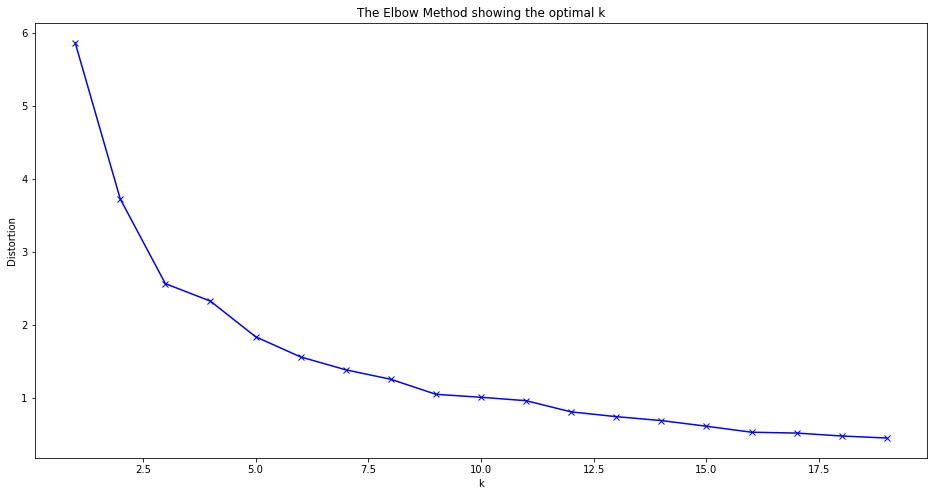

In [ ]:
from tslearn.utils import to_time_series_dataset
cluster = 3
df = deaths_pT_new.iloc[:,35:]
X_train = df.rolling(7, axis=1, min_periods=1).mean().fillna(0)
colors = ['blue', 'red', 'green']
names = ['blue cluster','red cluster','green cluster']
seed = 1
np.random.seed(seed)
X_train = to_time_series_dataset(X_train.copy())


#elbow method
distortions = []
K = range(1,20)
for k in K:
    km = TimeSeriesKMeans(n_clusters=k, verbose=True, random_state=seed,
                         max_iter=10)

    km.fit(X_train)
    distortions.append(km.inertia_)

plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

COVID-19 deaths vs time curves
4.052 --> 2.846 --> 2.655 --> 2.599 --> 2.585 --> 2.564 --> 2.564 --> 
green cluster, N = 158
red cluster, N = 9
blue cluster, N = 16


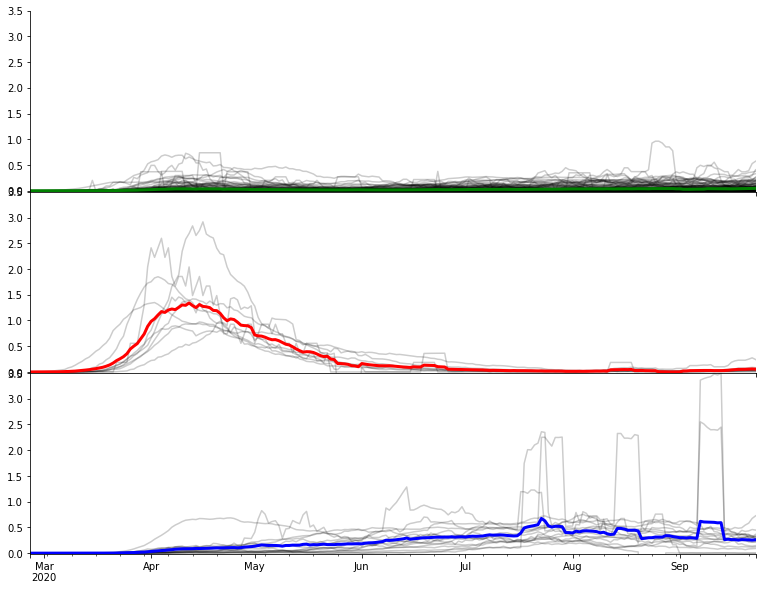

In [ ]:

print('COVID-19 deaths vs time curves')
km = TimeSeriesKMeans(n_clusters=cluster, verbose=True, random_state=seed,
                         max_iter=10)

y_pred = km.fit_predict(X_train)
clusters = pd.Series(data=y_pred, index=df.index)

f, (ax1, ax2, ax3) = plt.subplots(3, sharex=True, sharey=True,figsize=(13, 10))

for yi,cl,xs in zip(range(cluster),[2,1,0],[ax1,ax2,ax3]):
    data = df.rolling(7, axis=1, min_periods=1).mean().fillna(0).loc[clusters[clusters == cl].index]
    data.T.plot(legend=False, alpha=.2,color='black', ax=xs)
    data.mean(axis=0).plot(linewidth=3., color=colors[cl], ax=xs)
    n = len(data)
    print('{}, N = {}'.format(names[cl], n))

ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax3.spines['right'].set_visible(False)

f.subplots_adjust(hspace=0)
plt.ylim(-0.02, 3.5)
plt.setp([a.get_xticklabels() for a in f.axes[:-1]], visible=False)


In [ ]:
world_map = Map(tiles='cartodbpositron')
from IPython.display import IFrame
opa = [0.99,0.99,0.5]
for name in coord.index:
    CircleMarker([coord.loc[name].lat, coord.loc[name].long],
                 popup=Popup(max_width=450).add_child(
                     Vega(coord.loc[name].json, width=450, height=250)),
                 color=colors[clusters.loc[name]],
                 radius=5,
                 fill=True,
                 opacity=opa[clusters.loc[name]]).add_to(world_map)

In [ ]:
world_map

## Red Cluster: Countries that covid19 hit them hard in first wave (regarding deaths) but then number of death fell close to zero (mostly Europe)

## Blue Cluster: Countries which in March-April (first wave) had little to no deaths, but then number of deaths started to to rise and hasn't decreased yet. (Mostly America - North & South)

## Green Cluster: Number of deaths never rised dramatically, always near to zero. (maybe this cluster must break into smaller ones)

# Just Europe clustering

COVID-19 deaths vs time curves
4.940 --> 3.186 --> 3.017 --> 3.003 --> 3.003 --> 
green cluster, N = 6
red cluster, N = 30
blue cluster, N = 5


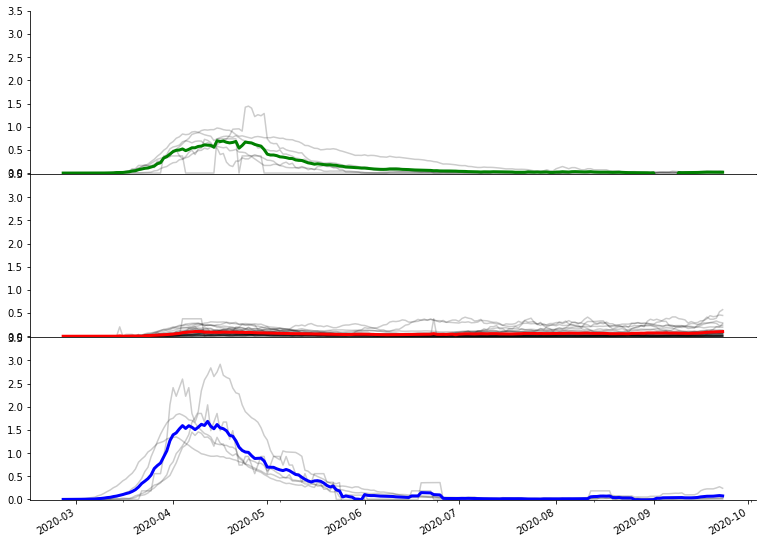

In [ ]:
from tslearn.utils import to_time_series_dataset
cluster = 3
df = deaths_pT_new_eur.iloc[:,35:]
X_train = df.rolling(7, axis=1, min_periods=1).mean().fillna(0)
colors = ['blue', 'red', 'green']
names = ['blue cluster','red cluster','green cluster']
seed = 1
np.random.seed(seed)
X_train = to_time_series_dataset(X_train.copy())

print('COVID-19 deaths vs time curves')
km = TimeSeriesKMeans(n_clusters=cluster, verbose=True, random_state=seed,
                         max_iter=10)

y_pred = km.fit_predict(X_train)
clusters = pd.Series(data=y_pred, index=df.index)

f, (ax1, ax2, ax3) = plt.subplots(3, sharex=True, sharey=True,figsize=(13, 10))

for yi,cl,xs in zip(range(cluster),[2,1,0],[ax1,ax2,ax3]):
    data = df.rolling(7, axis=1, min_periods=1).mean().fillna(0).loc[clusters[clusters == cl].index]
    data.T.plot(legend=False, alpha=.2,color='black', ax=xs)
    data.mean(axis=0).plot(linewidth=3., color=colors[cl], ax=xs)
    n = len(data)
    print('{}, N = {}'.format(names[cl], n))

ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax3.spines['right'].set_visible(False)

f.subplots_adjust(hspace=0)
plt.ylim(-0.02, 3.5)
plt.setp([a.get_xticklabels() for a in f.axes[:-1]], visible=False)


In [ ]:
europe_map = Map(tiles='cartodbpositron')
from IPython.display import IFrame
opa = [0.99,0.99,0.5]
for name in europe_coords.index:
    CircleMarker([europe_coords.loc[name].lat, europe_coords.loc[name].long],
                 popup=Popup(max_width=450).add_child(
                     Vega(europe_coords.loc[name].json, width=450, height=250)),
                 color=colors[clusters.loc[name]],
                 radius=5,
                 fill=True,
                 opacity=opa[clusters.loc[name]]).add_to(europe_map)

In [ ]:
europe_map